In [1]:
import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup
import re
from sklearn.cluster import KMeans
from geopy.geocoders import Nominatim 
import folium
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import json
from pandas.io.json import json_normalize
import seaborn as sns

### wrangling

In [2]:
airbnb=pd.read_csv('listings.csv')

In [3]:
airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


In [4]:
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

In [5]:
airbnb.isnull().sum()

id                                   0
name                                 2
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       2758
reviews_per_month                 2758
calculated_host_listings_count       0
availability_365                     0
dtype: int64

In [6]:
airbnb.drop(['host_name','last_review','calculated_host_listings_count'], axis=1, inplace=True)

In [7]:
airbnb.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,availability_365
count,7.907000e+03,7.907000e+03,7907.000000,7907.000000,7907.000000,7907.000000,7907.000000,5149.000000,7907.000000
mean,2.338862e+07,9.114481e+07,1.314192,103.848787,169.332996,17.510054,12.807386,1.043669,208.726318
std,1.016416e+07,8.190910e+07,0.030577,0.043675,340.187599,42.094616,29.707746,1.285851,146.120034
min,4.909100e+04,2.366600e+04,1.243870,103.646560,0.000000,1.000000,0.000000,0.010000,0.000000
25%,1.582180e+07,2.305808e+07,1.295795,103.835825,65.000000,1.000000,0.000000,0.180000,54.000000
50%,2.470627e+07,6.344891e+07,1.311030,103.849410,124.000000,3.000000,2.000000,0.550000,260.000000
75%,3.234850e+07,1.553811e+08,1.322110,103.872535,199.000000,10.000000,10.000000,1.370000,355.000000
max,3.811276e+07,2.885676e+08,1.454590,103.973420,10000.000000,1000.000000,323.000000,13.000000,365.000000


In [8]:
airbnb.fillna({'reviews_per_month':0}, inplace=True)

In [9]:
airbnb.reviews_per_month.isnull().sum()

0

In [10]:
temp=airbnb['number_of_reviews'].quantile(0.9)
for i in range(airbnb.shape[0]):
    if airbnb.loc[i, 'number_of_reviews']>=temp:
        airbnb.loc[i, 'ispop']='popular'
    else:
        airbnb.loc[i, 'ispop']='normal'

In [11]:
airbnb.head()

,id,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,availability_365,ispop
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,0.01,365,normal
1,50646,Pleasant Room along Bukit Timah,227796,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,0.28,365,normal
2,56334,COZICOMFORT,266763,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,0.20,365,normal
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,0.15,353,normal
4,71896,B&B Room 1 near Airport & EXPO,367042,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,0.22,355,normal


In [12]:
len(airbnb['host_id'].unique())

2705

In [13]:
airbnb['neighbourhood'].unique()

array(['Woodlands', 'Bukit Timah', 'Tampines', 'Bedok', 'Bukit Merah',
       'Newton', 'Geylang', 'River Valley', 'Jurong West', 'Rochor',
       'Queenstown', 'Serangoon', 'Marine Parade', 'Pasir Ris',
       'Toa Payoh', 'Outram', 'Punggol', 'Tanglin', 'Hougang', 'Kallang',
       'Novena', 'Downtown Core', 'Bukit Panjang', 'Singapore River',
       'Orchard', 'Ang Mo Kio', 'Bukit Batok', 'Museum', 'Sembawang',
       'Choa Chu Kang', 'Central Water Catchment', 'Sengkang', 'Clementi',
       'Jurong East', 'Bishan', 'Yishun', 'Mandai', 'Southern Islands',
       'Sungei Kadut', 'Western Water Catchment', 'Tuas', 'Marina South',
       'Lim Chu Kang'], dtype=object)

In [14]:
airbnb[airbnb['minimum_nights']==1000]

,id,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,availability_365,ispop
3304,21855881,Where Luxury City Living Reaches New Heights.,28954164,Central Region,Tanglin,1.31743,103.82931,Private room,81,1000,0,0.0,365,normal


(array([6.563e+03, 7.660e+02, 3.390e+02, 1.590e+02, 5.700e+01, 1.400e+01,
        5.000e+00, 0.000e+00, 1.000e+00, 3.000e+00]),
 array([ 0. ,  1.3,  2.6,  3.9,  5.2,  6.5,  7.8,  9.1, 10.4, 11.7, 13. ]),
 <a list of 10 Patch objects>)

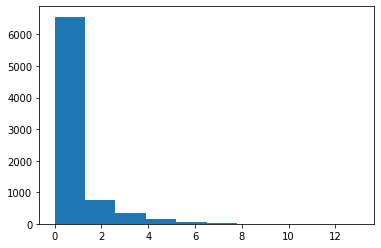

In [15]:
plt.hist(airbnb['reviews_per_month'])

In [17]:
address = 'Singapore'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Singapore are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Singapore are 1.2904753, 103.8520359.


In [18]:
CLIENT_ID = 'XYDZ0VBILNPZ5NOW0UF1W0ERN4VCFZ5IQLZKBU0FPSETQRO5' # your Foursquare ID
CLIENT_SECRET = 'E05RXLN1O0SI3HCQHSCKTJQY53WRV4EIRYCYW3TOJOKPF2MO' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

In [19]:
LIMIT = 300
radius = 15000 # define radius
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius, 
    LIMIT)

In [20]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5f2a16c0d79d8e3962625c35'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Singapore',
  'headerFullLocation': 'Singapore',
  'headerLocationGranularity': 'city',
  'totalResults': 240,
  'suggestedBounds': {'ne': {'lat': 1.425475435000135,
    'lng': 103.9868181595305},
   'sw': {'lat': 1.155475164999865, 'lng': 103.71725364046951}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4d438c6514aa8cfa743d5c3d',
       'name': 'National Gal\xadlery Singa\xadpore',
       'location': {'address': "1 St. Andrew's Road",
        'lat': 1.2907395913341984,
        'lng': 103.85154786540198,
        'labeledLatLngs': [{'label': 'display',
          'lat'

In [21]:
venus = results['response']['groups'][0]['items']
df=json_normalize(venus)
df

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  


,referralId,reasons.count,reasons.items,venue.id,venue.name,venue.location.address,venue.location.lat,venue.location.lng,venue.location.labeledLatLngs,venue.location.distance,...,venue.location.city,venue.location.country,venue.location.formattedAddress,venue.categories,venue.photos.count,venue.photos.groups,venue.location.crossStreet,venue.venuePage.id,venue.location.state,venue.location.neighborhood
0,e-0-4d438c6514aa8cfa743d5c3d-0,0,"[{'summary': 'This spot is popular', 'type': '...",4d438c6514aa8cfa743d5c3d,National Gal­lery Singa­pore,1 St. Andrew's Road,1.290740,103.851548,"[{'label': 'display', 'lat': 1.290739591334198...",61,...,Singapore,Singapore,"[1 St. Andrew's Road, 178957, Singapore]","[{'id': '4bf58dd8d48988d1e2931735', 'name': 'A...",0,[],NaN,NaN,NaN,NaN
1,e-0-4b058810f964a52036af22e3-1,0,"[{'summary': 'This spot is popular', 'type': '...",4b058810f964a52036af22e3,Esplanade Park,Connaught Dr.,1.288968,103.853580,"[{'label': 'display', 'lat': 1.288967570835395...",240,...,Singapore,Singapore,"[Connaught Dr. (Opp Padang & City Hall), 17955...","[{'id': '4bf58dd8d48988d163941735', 'name': 'P...",0,[],Opp Padang & City Hall,NaN,NaN,NaN
2,e-0-4b058814f964a52090b022e3-2,0,"[{'summary': 'This spot is popular', 'type': '...",4b058814f964a52090b022e3,Esplanade - Theatres On The Bay,1 Esplanade Dr.,1.289837,103.855404,NaN,381,...,Singapore,Singapore,"[1 Esplanade Dr., 038981, Singapore]","[{'id': '4bf58dd8d48988d1f2931735', 'name': 'P...",0,[],NaN,39186426,NaN,NaN
3,e-0-571b758d498e166ab0717ce7-3,0,"[{'summary': 'This spot is popular', 'type': '...",571b758d498e166ab0717ce7,Esplanade Theatre,Esplanade - Theatres On The Bay,1.289932,103.855037,"[{'label': 'display', 'lat': 1.289931806154257...",339,...,Singapore,Singapore,[Esplanade - Theatres On The Bay (1 Esplanade ...,"[{'id': '4bf58dd8d48988d137941735', 'name': 'T...",0,[],1 Esplanade Dr,NaN,NaN,NaN
4,e-0-56a80c97498e568a286384c6-4,0,"[{'summary': 'This spot is popular', 'type': '...",56a80c97498e568a286384c6,JW Marriott Hotel Singapore South Beach,"30 Beach Road, Access Via Nicoll Highway",1.294469,103.855793,"[{'label': 'display', 'lat': 1.294468772772339...",610,...,Singapore,Singapore,"[30 Beach Road, Access Via Nicoll Highway, 189...","[{'id': '4bf58dd8d48988d1fa931735', 'name': 'H...",0,[],NaN,NaN,SG-01,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,e-0-54164a0f498e9aee39047c1a-95,0,"[{'summary': 'This spot is popular', 'type': '...",54164a0f498e9aee39047c1a,Hotel Jen Orchardgateway Singapore,277 Orchard Rd.,1.300456,103.838878,"[{'label': 'display', 'lat': 1.300456413722060...",1838,...,Singapore,Singapore,"[277 Orchard Rd., 238858, Singapore]","[{'id': '4bf58dd8d48988d1fa931735', 'name': 'H...",0,[],NaN,NaN,NaN,NaN
96,e-0-55865fb8498e53074ef52dac-96,0,"[{'summary': 'This spot is popular', 'type': '...",55865fb8498e53074ef52dac,PizzaFace,"302 Beach Road, Concourse Skyline #01-03",1.301028,103.861535,"[{'label': 'display', 'lat': 1.301028, 'lng': ...",1580,...,Singapore,Singapore,"[302 Beach Road, Concourse Skyline #01-03, 199...","[{'id': '4bf58dd8d48988d110941735', 'name': 'I...",0,[],NaN,NaN,NaN,Kallang
97,e-0-59eac1980123581cba9d4aa2-97,0,"[{'summary': 'This spot is popular', 'type': '...",59eac1980123581cba9d4aa2,Genki Sushi,"391, B2-25/26",1.303579,103.834440,"[{'label': 'display', 'lat': 1.303578748970929...",2441,...,Orchard,Singapore,"[391, B2-25/26 (Orchard Road), 238873, Singapore]","[{'id': '4bf58dd8d48988d1d2941735', 'name': 'S...",0,[],Orchard Road,NaN,新加坡,NaN
98,e-0-4da0803dbb206ea88004ddfd-98,0,"[{'summary': 'This spot is popular', 'type': '...",4da0803dbb206ea88004ddfd,The Projector,#05-00 Golden Mile Tower,1.302255,103.863553,"[{'label': 'display', 'lat': 1.302255316564422...",1833,...,Singapore,Singapore,"[#05-00 Golden Mile Tower (6001 Beach Road), 1...","[{'id': '4bf58dd8d48988d180941735', 'name': 'M...",0,[],6001 Beach Road,NaN,NaN,NaN


In [22]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [23]:
# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =df.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,National Gal­lery Singa­pore,Art Gallery,1.290740,103.851548
1,Esplanade Park,Park,1.288968,103.853580
2,Esplanade - Theatres On The Bay,Performing Arts Venue,1.289837,103.855404
3,Esplanade Theatre,Theater,1.289932,103.855037
4,JW Marriott Hotel Singapore South Beach,Hotel,1.294469,103.855793


### exploration

In [24]:
most=nearby_venues['categories'].value_counts().to_frame()
most.head(10)

,categories
Hotel,13
Waterfront,5
Japanese Restaurant,3
Park,3
Event Space,3
Movie Theater,2
Bookstore,2
Italian Restaurant,2
Café,2
Concert Hall,2


In [25]:
smap = folium.Map(location=[latitude, longitude], zoom_start=13)
for lat, lng, label in zip(nearby_venues.lat, nearby_venues.lng, nearby_venues.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(smap)

# display map
smap

In [26]:
airbnb

,id,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,availability_365,ispop
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,0.01,365,normal
1,50646,Pleasant Room along Bukit Timah,227796,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,0.28,365,normal
2,56334,COZICOMFORT,266763,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,0.20,365,normal
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,0.15,353,normal
4,71896,B&B Room 1 near Airport & EXPO,367042,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,0.22,355,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,0.00,61,normal
7903,38108273,3bedroom luxury at Orchard,238891646,Central Region,Tanglin,1.29269,103.82623,Entire home/apt,550,6,0,0.00,365,normal
7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Central Region,Kallang,1.31286,103.85996,Private room,58,30,0,0.00,173,normal
7905,38110493,Cheap Master Room in Central of Singapore,243835202,Central Region,River Valley,1.29543,103.83801,Private room,56,14,0,0.00,30,normal


In [27]:
amap = folium.Map(location=[latitude, longitude], zoom_start=13)
for lat, lng, label in zip(airbnb.latitude, airbnb.longitude, airbnb.neighbourhood_group):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='#3388ff',
        popup=label,
        fill = True,
        fill_color='#3388ff',
        fill_opacity=0.6
    ).add_to(amap)

# display map
amap

(0.0, 500.0)

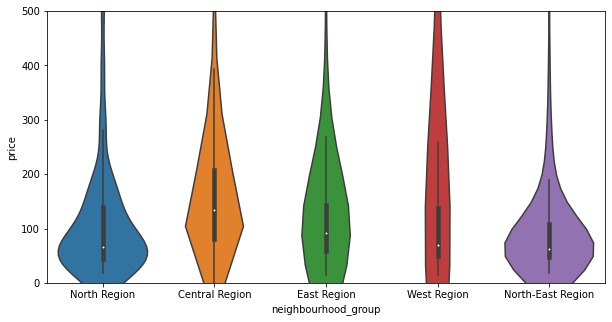

In [28]:
fig = plt.figure(figsize=(10,5))
sns.violinplot(data=airbnb, x='neighbourhood_group', y='price')
plt.ylim(0,500)

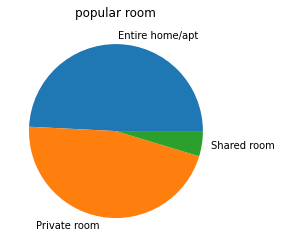

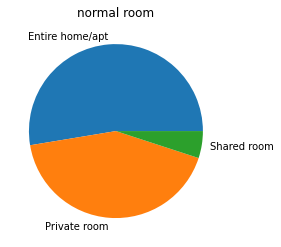

In [34]:
room_type=airbnb[airbnb['ispop']=='popular']['room_type'].value_counts()
room_type2=airbnb[airbnb['ispop']=='normal']['room_type'].value_counts()
plt.pie(x=room_type, labels=room_type.index)
plt.title('popular room')
plt.show()
plt.pie(x=room_type2, labels=room_type2.index)
plt.title('normal room')
plt.show()

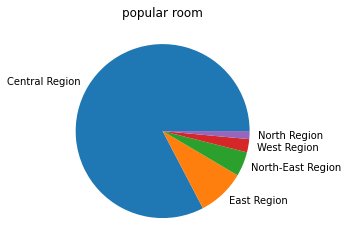

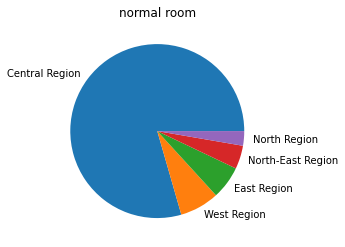

In [35]:
room_re=airbnb[airbnb['ispop']=='popular']['neighbourhood_group'].value_counts()
room_re2=airbnb[airbnb['ispop']=='normal']['neighbourhood_group'].value_counts()
plt.pie(x=room_re, labels=room_re.index)
plt.title('popular room')
plt.show()
plt.pie(x=room_re2, labels=room_re2.index)
plt.title('normal room')
plt.show()